In [1]:
!jupyter nbextension enable --py widgetsnbextension


Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


In [2]:
import cv2
import torch
import imageio
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torch.utils.data import DataLoader

import torch
import torch.nn.functional as F

from tqdm.notebook import tqdm
from torch import Tensor
from itertools import compress, cycle
from collections import OrderedDict
from scipy.interpolate import griddata
from IPython.display import Image

from utils.utils import *

from utils.plotting import Plotter
from utils.gl_solver import GLSolver
from utils.parameters_init import ParametersInit
from utils.random_input_field import RandomInputField

import warnings
warnings.filterwarnings('ignore')

EPOCHS = 20_000
LR = 1
# SEED = 1234

# np.random.seed(SEED)
# torch.manual_seed(SEED)
# torch.cuda.manual_seed(SEED)
# torch.cuda.manual_seed_all(SEED)
# torch.set_default_tensor_type(torch.FloatTensor)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [3]:
path = "allinputnet_newarchitecture"
mtlibpath_prefix ="allinputnet_newarchitecture_mtl"

Nx=64
Ny=64

Lx= 60
Ly= 60
T_end = 1
dt = 0.005

myubatch_size = 32768

input_to_defect_ratio_sqrt = Nx // 2
N_ITERATIONS = int(T_end / dt)
A_norm, A_original, mem_rate, myu_original = compute_A_norm(
    Nx=Nx, 
    Ny=Ny, 
    input_to_defect_ratio=input_to_defect_ratio_sqrt*input_to_defect_ratio_sqrt, 
    mean=5.4, 
    std_deviation=0.8, 
    time_period=25, 
    Lx=Lx, 
    Ly=Ly, 
    dt=dt, 
    T_End=T_end, 
    parallel_runs=1, 
    input_scale=0.75, 
    mem_coef=1, 
    time_period_parameter=100, 
    _mean=5.4, 
    std_deviation_run_computation=1,
    input_myu=None
)

  0%|          | 0/200 [00:00<?, ?it/s]

100%|██████████| 200/200 [00:00<00:00, 1733.55it/s]

Unique Myus count	 8
Max value of myu:	 104.14104515595743
Min value of myu:	 28.893477672414086
Unique values: [28.893477672414086, 53.20229459360476, 58.107982450278136, 66.83168520679922, 73.33809836951713, 81.01192118026599, 85.93150003649163, 104.14104515595743]
Counts:		 [102400 102400 102400 102400 102400 102400 102400 102400]
A.shape=(1, 200, 64, 64),
Myu.shape=(1, 200, 64, 64),

Any NaN values in Myu		 False
Any NaN values in A_original	 False


In [4]:
def output_plot(data, mem_rat, save_fig=False, file_name="A_in_norm_80%04d.png"):
    fig = plt.figure(1, figsize=(6.5, 6.5))
    for index in tqdm(range(mem_rat)):
        if index % 2 == 0:
            plt.clf()
            plt.imshow(data[index, :, :], origin='lower', vmax=0.9*np.max(data))
            plt.colorbar()
            if save_fig:
                filename = file_name % (index/2)
                plt.savefig(filename)

  0%|          | 0/200 [00:00<?, ?it/s]

100%|██████████| 200/200 [00:03<00:00, 50.99it/s]


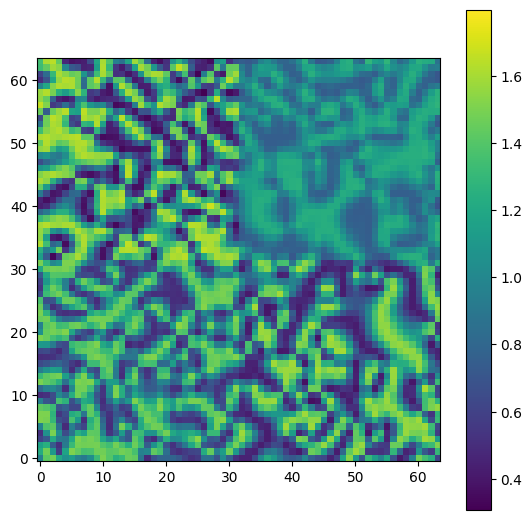

In [5]:
output_plot(A_norm, mem_rate)

GETTING HANDS DIRTY WITH THE NEURAL NETWORKS

In [6]:
x = np.linspace(0, 4, Nx).flatten()[:, None] - 2
y = np.linspace(0, 4, Ny).flatten()[:, None] - 2
t = np.linspace(0, T_end, N_ITERATIONS).flatten()[:, None]

Exact = A_original.squeeze(0)

X, T, Y = np.meshgrid(x, t, y)

X_star = np.hstack((X.flatten()[:, None], Y.flatten()[:, None], T.flatten()[:, None]))
u_star = Exact.flatten()
u_star = np.hstack([u_star.real[:, None],u_star.imag[:, None]])

$$
\begin{aligned}
\partial_{t} A &= \mu A+\Delta A-|A|^{2} A
\end{aligned}
$$

In [7]:
class FCN(nn.Module):
    def __init__(self, layers_list, activation_function_list = None):
        nn.Module.__init__(self)

        self._depth = len(layers_list) - 1
        if activation_function_list is None:
            activation_function_list = [torch.nn.Softplus for _ in range(self._depth - 1)]        
        
        seq = []
        for i, activation_function in enumerate(activation_function_list):
            seq.append(('layer_%d' % i, torch.nn.Linear(layers_list[i], layers_list[i+1], dtype = torch.float64)))
            seq.append(('activation_%d' % i, activation_function()))
        
        last_size = sum(layers_list[1:-1])
        seq.append(('layer_%d' % (self._depth - 1), torch.nn.Linear(last_size, layers_list[-1], dtype = torch.float64)))
        
        self._Wtmx = torch.nn.Sequential(OrderedDict(seq))
        self.optimizer = torch.optim.Adam( params = self._Wtmx.parameters(), lr=0.01 )    
        
    def forward(self, x):
        prefinal = []
        Seq = self._Wtmx.children()
        for i in range((len(self._Wtmx)//2)):            
            x = next(Seq)(next(Seq)(x))
            prefinal.append(x)
        return next(Seq)(torch.cat(prefinal,dim = -1))
    
class Attention(nn.Module):
    def __init__(self, layer_size, number_of_layers, activation_function_list = None):
        nn.Module.__init__(self)

    def forward(self,x):
        pass

In [8]:
class ALLINPUTNET(nn.Module):
    def __init__(self):
        super(ALLINPUTNET, self).__init__()
        self.encoder = FCN(layers_list = [3,4,8,16])
        self.decoder = FCN(layers_list = [16,8,4,2])
        self.attention = Attention(layer_size = 32, number_of_layers= 3)
        self.optimizer = torch.optim.Adam(params = list(self.encoder._Wtmx.parameters()), lr=0.01)

        
    def forward(self, x):
        E = self.encoder.forward(x)
#        A = self.attention.forward(E)
        return self.decoder.forward(E)

    def predict(self, x):
        self.eval()
        if type(x) is not torch.Tensor:
            x = torch.tensor(x, dtype = torch.float64).to(device)
        y =  self.forward(x).cpu().detach().numpy()
        return y[:,0] + y[:,1]*1j    

    def rmsef(self, y, y_pred):
        mseloss = torch.sum((y_pred - y)**2, dim = 1)
        return torch.mean(torch.sqrt(mseloss))   

    def msef(self, y, y_pred):
        return torch.mean((y_pred - y)**2)       

    def zero_grad(self, set_to_none: bool = False) -> None:
        self.encoder._Wtmx.zero_grad()
        self.decoder._Wtmx.zero_grad()
        return super().zero_grad(set_to_none)
        
    def fastmsebatchtrain(self, x, y, epochs=100, batch_size = 64):
        
        x = torch.tensor(x, dtype = torch.float64).to(device)
        y = torch.tensor(y, dtype = torch.float64).to(device)
        dataloader = DataLoader(dataset = torch.hstack((x,y)), batch_size=batch_size, shuffle=True)
        
        self.optimizer.zero_grad()
        L = []
        
        pbar = tqdm(total=epochs)
        try:
            while True:
                if pbar.n >= epochs:
                    break
                for tmp in dataloader:
                    (tmpx, tmpy, tmpt, tmpu_real, tmpu_img) = tmp.T
                    X = torch.stack((tmpx,tmpy,tmpt)).T
                    U = torch.stack((tmpu_real, tmpu_img)).T

                    y_pred = self.forward(X)
                    loss = self.msef(y_pred,U)
                    L.append(loss.cpu().detach().numpy())
                    loss.backward()
                    self.optimizer.step()
                    self.zero_grad()
                    self.optimizer.zero_grad()
                    # Update the progress bar
                    if pbar.n >= epochs:
                        break
                    pbar.update(1)
                        
        except Exception as e:
            raise Exception(e)
        finally:
            # Close the progress bar
            pbar.close()          
        return L
    
    def fastrmsebatchtrain(self, x, y, epochs=100, batch_size = 64):
        
        x = torch.tensor(x, dtype = torch.float64).to(device)
        y = torch.tensor(y, dtype = torch.float64).to(device)
        dataloader = DataLoader(dataset = torch.hstack((x,y)), batch_size=batch_size, shuffle=True)
        
        self.optimizer.zero_grad()
        L = []
        
        pbar = tqdm(total=epochs)
        try:
            while pbar.n < epochs:
                for tmp in dataloader:
                    (tmpx, tmpy, tmpt, tmpu_real, tmpu_img) = tmp.T
                    X = torch.stack((tmpx,tmpy,tmpt)).T
                    U = torch.stack((tmpu_real, tmpu_img)).T

                    y_pred = self.forward(X)
                    loss = self.rmsef(y_pred,U)
                    L.append(loss.cpu().detach().numpy())
                    loss.backward()
                    self.optimizer.step()
                    self.zero_grad()
                    self.optimizer.zero_grad()
                    # Update the progress bar
                    if pbar.n >= epochs:
                        break
                    pbar.update(1)
                        
        except Exception as e:
            raise Exception(e)
        finally:
            # Close the progress bar
            pbar.close()          
        return L

In [14]:
torch.manual_seed(0)
device = 'cpu'
 
net = ALLINPUTNET().to(device)
net

ALLINPUTNET(
  (encoder): FCN(
    (_Wtmx): Sequential(
      (layer_0): Linear(in_features=3, out_features=4, bias=True)
      (activation_0): Softplus(beta=1, threshold=20)
      (layer_1): Linear(in_features=4, out_features=8, bias=True)
      (activation_1): Softplus(beta=1, threshold=20)
      (layer_2): Linear(in_features=8, out_features=16, bias=True)
      (activation_2): Softplus(beta=1, threshold=20)
      (layer_3): Linear(in_features=28, out_features=32, bias=True)
    )
  )
  (decoder): FCN(
    (_Wtmx): Sequential(
      (layer_0): Linear(in_features=32, out_features=16, bias=True)
      (activation_0): Softplus(beta=1, threshold=20)
      (layer_1): Linear(in_features=16, out_features=8, bias=True)
      (activation_1): Softplus(beta=1, threshold=20)
      (layer_2): Linear(in_features=8, out_features=4, bias=True)
      (activation_2): Softplus(beta=1, threshold=20)
      (layer_3): Linear(in_features=28, out_features=2, bias=True)
    )
  )
  (attention): Attention()
)

In [15]:
net.optimizer.param_groups[0]['lr'] = 0.03
L1 = net.fastrmsebatchtrain(x = X_star, y = u_star, epochs = 50000)

  0%|          | 0/50000 [00:00<?, ?it/s]

100%|██████████| 50000/50000 [00:43<00:00, 1142.37it/s]


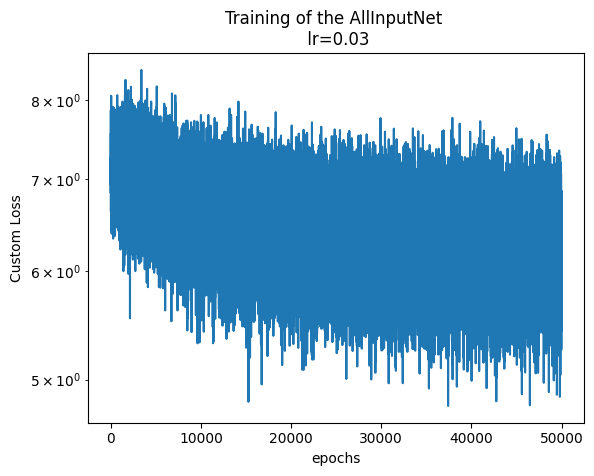

In [16]:
plt.plot(L1)
plt.yscale('log')
plt.xlabel('epochs')
plt.ylabel('Custom Loss')
plt.title('Training of the AllInputNet \n lr=0.03')
plt.savefig(f'{mtlibpath_prefix}_allinputnet003.png')

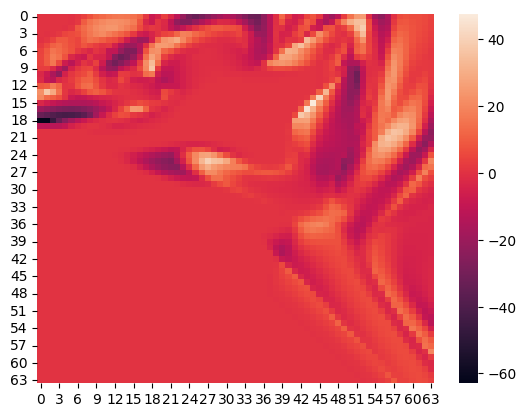

<Axes: >

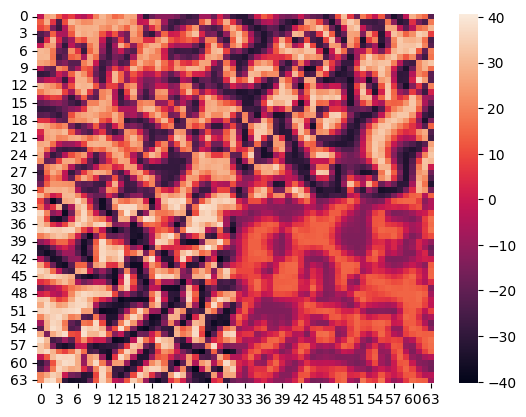

In [17]:
A2 = net.predict(X_star)
import seaborn as sns
sns.heatmap(((np.real(A2)*np.imag(A2)).reshape(A_original.shape))[0][-1])
plt.show()
sns.heatmap(((np.real(A_original)*np.imag(A_original)).reshape(A_original.shape))[0][-1])



In [18]:
net.optimizer.param_groups[0]['lr'] = 0.00005
L2 = net.fastrmsebatchtrain(x = X_star, y = u_star, epochs = 400000)

100%|██████████| 400000/400000 [05:44<00:00, 1161.17it/s]


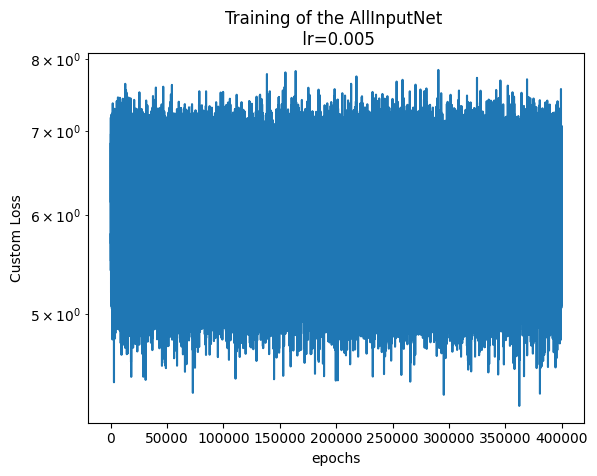

In [19]:
plt.plot(L2)
plt.yscale('log')
plt.xlabel('epochs')
plt.ylabel('Custom Loss')
plt.title('Training of the AllInputNet \n lr=0.005')
plt.savefig(f'{mtlibpath_prefix}_allinputnet0005.png')

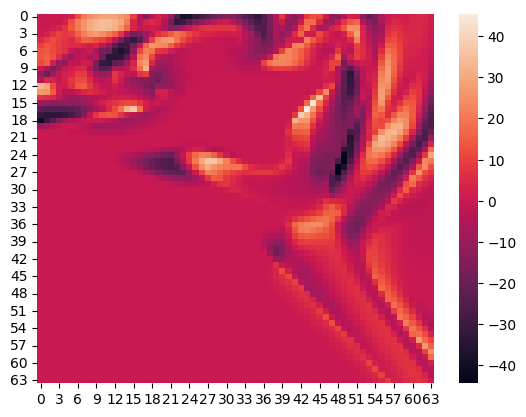

<Axes: >

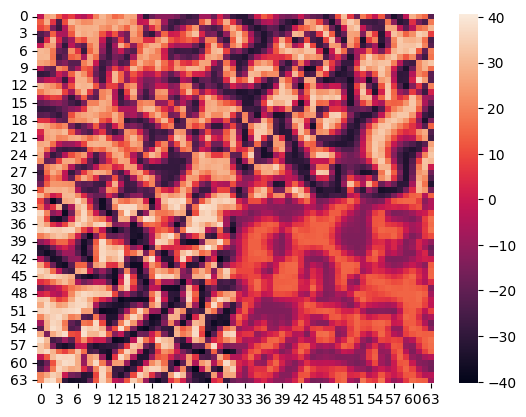

In [20]:
A2 = net.predict(X_star)
import seaborn as sns
sns.heatmap(((np.real(A2)*np.imag(A2)).reshape(A_original.shape))[0][-1])
plt.show()
sns.heatmap(((np.real(A_original)*np.imag(A_original)).reshape(A_original.shape))[0][-1])


In [21]:
module = np.abs(A2-A_original.reshape(-1))

In [22]:
np.mean(module**2)

46.705480908346324

100%|██████████| 200/200 [00:11<00:00, 18.12it/s]


GIF successfully saved at allinputnet_newarchitecture.gif


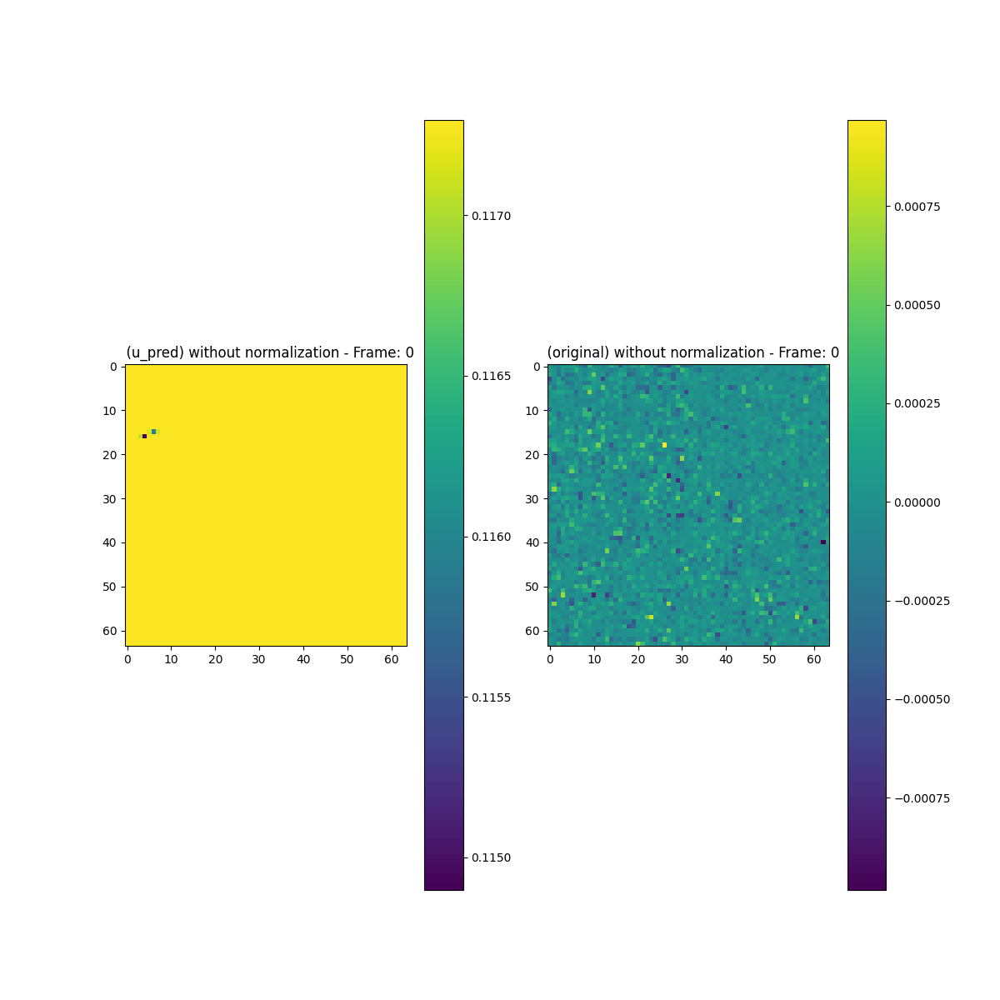

In [23]:
create_gifs(
    memory_rate=mem_rate,
    u_pred=A2,
    original=A_original,
    save=True,
    path_for_gif=path+".gif",
    duration=500,
    title=" "
)
Image(filename=path+".gif")